End-to-End Dog Breed Classificaion Problem


Builds a multi-class image classifier using Tensorflow 2.0 and TensorFlow Hub.

#1. Problem
Identifying the breed of a dog given an image of a dog.

When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.

#2: Data
The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

#3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

#4. Features
Some information about the data:

We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
There are 120 breeds of dogs (this means there are 120 different classes).
There are around 10,000+ images in the training set (these images have labels).
There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them).

In [ ]:
#!unzip "/content/drive/MyDrive/Dog-Breed-Selector/dog-breed-identification (1).zip" -d "/content/drive/MyDrive/Dog-Breed-Selector"

In [ ]:
#!pip install -U tensorflow
#!pip install -U tensorflow_hub
#!pip install tensorflow==2.15.0 tensorflow-hub keras==2.15.0


In [ ]:
#Import Tensorflow into Colab

import tensorflow as tf
import tensorflow_hub as hub
print(tf.__version__)

2.15.0


In [ ]:
#Checking if the GPU is available
print("GPU Available: ", "Yes" if tf.config.list_physical_devices('GPU') else "No")

GPU Available:  Yes


Step 1 is always turning our images into tensors, since it's a numerical reprsentation

In [ ]:
#Checking out the labels of our data

In [ ]:
import pandas as pd
labels = pd.read_csv("/content/drive/MyDrive/Dog-Breed-Selector/labels.csv")
print(labels.describe())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126


In [ ]:
labels.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

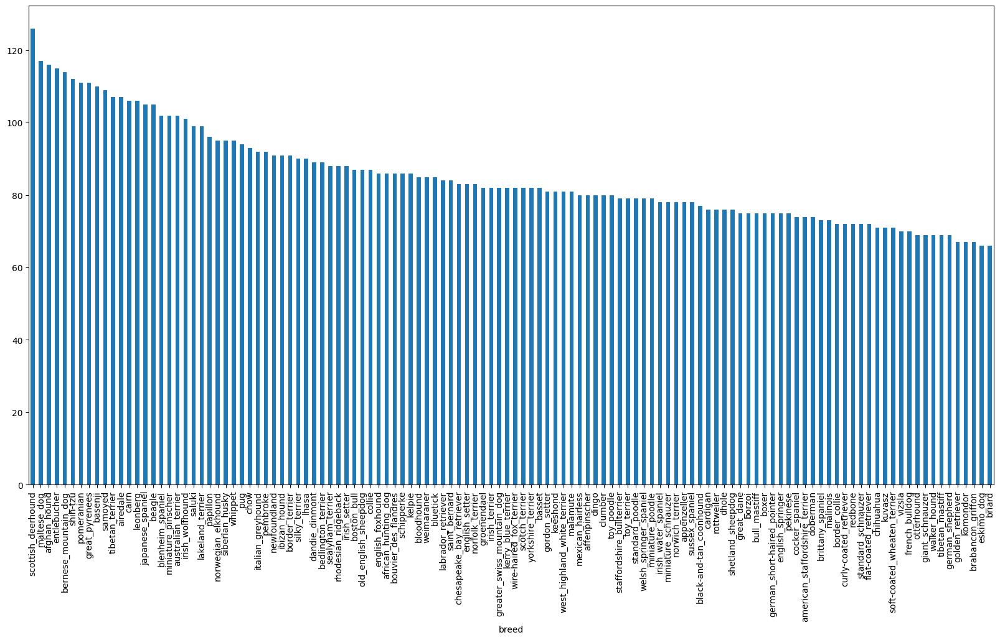

In [ ]:
#How many images are there of each breed?
labels.breed.value_counts().plot.bar(figsize = (20,10))

In [ ]:
import numpy as np
np.mean(labels.breed.value_counts())

85.18333333333334

In [ ]:
#Google Reccomends about 100 for each class, with atleast 10. It's not perfect, but decent enough, at mean of 85.

In [ ]:
np.median(labels.breed.value_counts())

82.0

In [ ]:
#Even median checks out, the reason we use median is becuase it's less susceptible to outliers.

In [ ]:
#Preparing The Images.
#First Let's see what an image looks like:

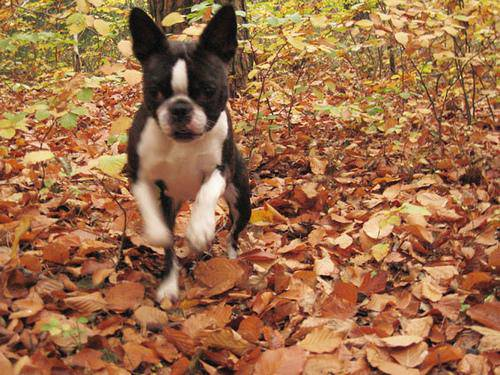

In [ ]:
from IPython.display import Image
Image(filename = "/content/drive/MyDrive/Dog-Breed-Selector/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

In [ ]:
#We can see how writing the file path name every single time can be very annoying, therefore, the best thing to do right now would be
#to create a list with all the file path names"

In [ ]:
labels.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
#Same Path: /content/drive/MyDrive/Dog-Breed-Selector/train/000bec180eb18c7604dcecc8fe0dba07.jpg

In [ ]:
filepaths = ["/content/drive/MyDrive/Dog-Breed-Selector/train/" + fname + ".jpg" for fname in labels.id]

In [ ]:
filepaths[:10]

['/content/drive/MyDrive/Dog-Breed-Selector/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog-Breed-Selector/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog-Breed-Selector/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog-Breed-Selector/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog-Breed-Selector/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog-Breed-Selector/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog-Breed-Selector/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog-Breed-Selector/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog-Breed-Selector/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog-Breed-Selector/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether Number of File Names Matches The Number of Image Files

In [ ]:
import os

if len( os.listdir("/content/drive/MyDrive/Dog-Breed-Selector/train")) == len(filepaths):
  print("Number of file names matches the number of image files")
else:
  print("Number of file names does not match the number of image files")

Number of file names matches the number of image files


In [ ]:
labels

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever
...,...,...
10217,ffd25009d635cfd16e793503ac5edef0,borzoi
10218,ffd3f636f7f379c51ba3648a9ff8254f,dandie_dinmont
10219,ffe2ca6c940cddfee68fa3cc6c63213f,airedale
10220,ffe5f6d8e2bff356e9482a80a6e29aac,miniature_pinscher


In [ ]:
labels = labels["breed"].to_numpy()
# labels = np.array(labels) # does same thing as above

In [ ]:
#Check if all the data got converted properly, by comparing the length of the filepaths to the labels
if (len(filepaths) == len(labels)):
  print("Number of filepaths matches number of labels")
else:
  print("Number of filepaths does not match number of labels")

Number of filepaths matches number of labels


In [ ]:
import numpy as np
#Finding The Number of Breeds and What They Are
breeds = np.unique(labels)
breeds_first = breeds

In [ ]:
def boolean_array_conveter (labels, dog_breeds):
  """
  Returns a boolean array for each of the labels in the labels arrayy
  """
  bool_arr = [label == dog_breeds for label in labels]
  return bool_arr

In [ ]:
bool_array = boolean_array_conveter(labels, breeds)
bool_array[:1]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False])]

Let's Test if It worked

In [ ]:
arr = []
for i in range(1000):
    # Check if the label exists in the breeds array
    if labels[i] in breeds:
        arr.append(True)
    else:
        arr.append(False)

# Check if there is any issue with boolean labeling
if not all(arr):
    print("There's an issue with boolean labelling")
else:
    print("Boolean Labelling is Done Properly")

Boolean Labelling is Done Properly


Since THe FIrst 1000 seem to be done properly, we can infer it's done properly for the rest too.

In [ ]:
#Creating Your Own Validation
from sklearn.model_selection import train_test_split
x = filepaths
y = bool_array

In [ ]:
num = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
x_train, x_val, y_train, y_val = train_test_split(x[:num], y[:num], test_size = 0.2, random_state = 0)

# Preprocessing Images (turning images into Tensors)

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, image
3. Turn our image (a jpg) into Tensors
4. Normalize our image (convert color channel values from from 0-255 to 0-1).
5. Resize the image to be a shape of (224, 224)
6. Return the modified image

In [ ]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filepaths[0]) #Example of what an image looks like as a numpy array
tf.constant(image) #Now The Image Has Been Turned into a Tensor

<tf.Tensor: shape=(375, 500, 3), dtype=uint8, numpy=
array([[[108,  46,   0],
        [152,  92,  42],
        [180, 120,  70],
        ...,
        [176, 144,  69],
        [189, 157,  82],
        [214, 182, 107]],

       [[151,  93,  47],
        [179, 121,  75],
        [167, 111,  64],
        ...,
        [167, 136,  56],
        [172, 139,  60],
        [188, 157,  77]],

       [[151,  98,  56],
        [188, 137,  94],
        [162, 113,  70],
        ...,
        [200, 168,  81],
        [196, 162,  75],
        [200, 168,  81]],

       ...,

       [[189, 122,  69],
        [186, 119,  66],
        [183, 116,  63],
        ...,
        [213, 160, 106],
        [212, 159, 107],
        [209, 156, 102]],

       [[186, 119,  66],
        [184, 117,  64],
        [183, 116,  63],
        ...,
        [197, 145,  88],
        [199, 146,  92],
        [199, 147,  90]],

       [[182, 115,  62],
        [181, 114,  61],
        [183, 116,  63],
        ...,
        [184, 132,  7

That's what an image lookslike as a tensor, so now it's time for us to write a function to convert all the images into tensors

The Purpose of the Function:

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our image (a jpg) into Tensors
4. Normalize our `image` (convert color channel values from from 0-255 to 0-1).
5. Resize the `image ` to be a shape of (224, 224)
6. Return the modified `image `

We resize it to fit the acceptable shape of the ML model

In [ ]:
img_size = 224

def image_preprocessor (path):
  """
  Takes the image file path and turns the image into a tensor
  """
  image = tf.io.read_file(path)
  image = tf.image.decode_jpeg(image, channels= 3)
  image = tf.image.convert_image_dtype(image, tf.float32)
  #Normalizes the image to make calculations easier
  image = tf.image.resize(image, size = [img_size, img_size])

  return image


# Turning our Data into Batches

In [ ]:
#To Turn data into batches you need to put data in the form of a tuple (image, label)
def get_image_label (path, label):
  """
  Returns a tuple of an image as a tensor, and the label of that image
  """
  image = image_preprocessor (path)
  return image, label

Writing a Function To Turn all Our Data into Batches of Size 32

We'll have 3 Types of Batches:

1. Training Batch.
2. Validation Batch.
3. Test Batch

In [ ]:
def create_batches(x, y=None, batch_size = 32, valid_data = False, test_data = False):
  """
  Creates Batches of Data out of image(x) and label (y) pairs.
  Shuffles the training data, but doesn't shuffle the validation data.
  Also accepts test data as input, which has no labels, therefore y = None
  """
  #Test Data Set
  if test_data:
    print("Creating Test Data Batches")
    data = tf.data.Dataset.from_tensor_slices(tf.constant(x))
    data_batch = data.map(image_preprocessor).batch(batch_size)
    return data_batch

  #Validation DataSet

  elif valid_data:
    print("Creating a Validation Dataset")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y)))
    data_batch = data.map(get_image_label).batch(batch_size)
    return data_batch

  #Train DataSet
  #If it's a training Dataset, we want to shuffle it
  else:
    print("Creating a Training Dataset")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y)))
    #Shuffling Path Names
    data = data.shuffle(buffer_size = len(x))
    data_batch = data.map(get_image_label).batch(batch_size)
    return data_batch



Now Actually Creating The Training and Validation DataSets

In [ ]:
train_data = create_batches(x_train,y_train)
val_data = create_batches(x_val,y_val,valid_data=True)

Creating a Training Dataset
Creating a Validation Dataset


In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Visualizing The Batch Data

In [ ]:
import matplotlib.pyplot as plt

def show_batch(image_batch):
  """
  Displays the first batch of images from the image batch
  """
  s= next(image_batch.as_numpy_iterator())
  images, labels = s
  plt.figure(figsize = (10,10))
  for i in range(32):
    ax = plt.subplot(7,5,i+1)
    plt.imshow(images[i])
    index = np.argmax(labels[i])
    plt.title(breeds[index])
    plt.axis("off")
    plt.tight_layout()

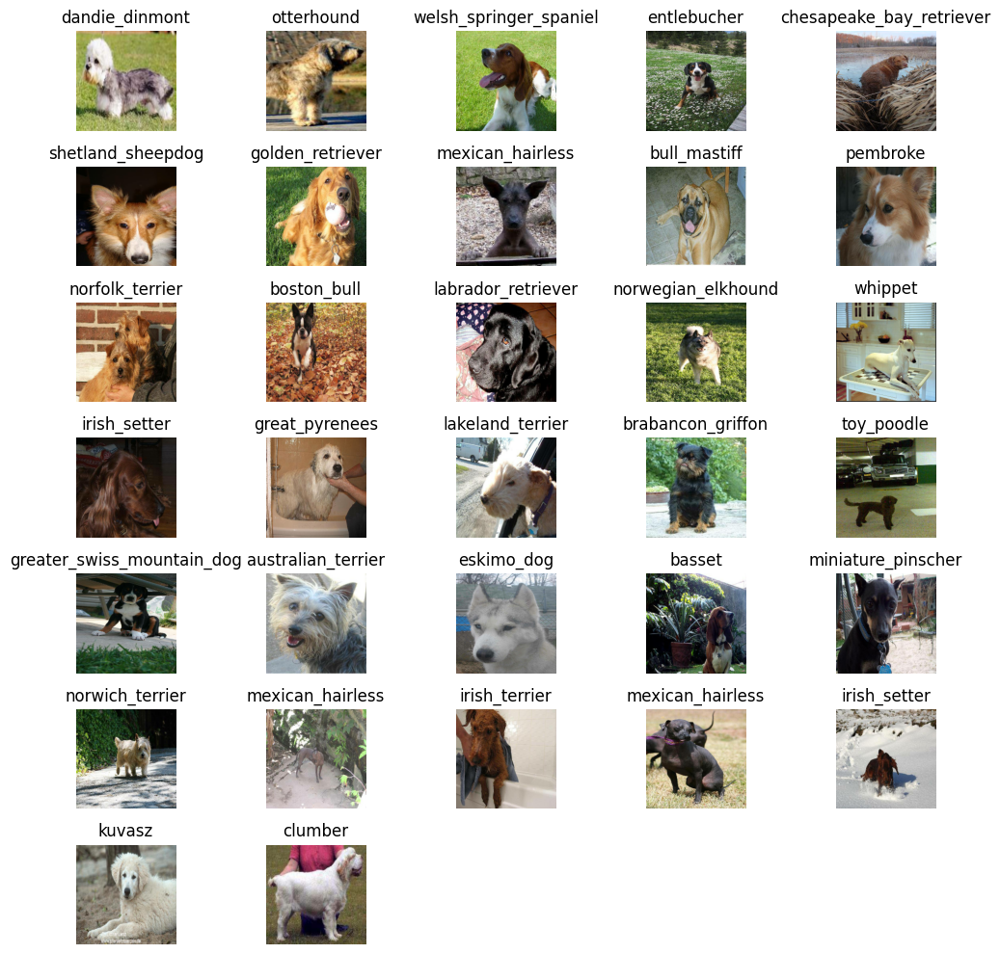

In [ ]:
show_batch(train_data)

Time To Create Your Own Model

In [ ]:
inp_shape = [None, 224, 224, 3]
out_shape = len(breeds)
import tensorflow_hub as hub

In [ ]:
print("GPU Available: ", "Yes" if tf.config.list_physical_devices('GPU') else "No")

GPU Available:  Yes


In [ ]:
import tensorflow as tf
import tensorflow_hub as hub


def create_model(input_shape = inp_shape, output_shape = out_shape):
  print("Building Model with the following parameters: ")
  print(f"Input Shape: {input_shape}")
  print(f"Output Shape: {output_shape}")

  #Settup Model
  m = tf.keras.Sequential([
    hub.KerasLayer("https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4"),  # Can be True, see below.
    tf.keras.layers.Dense(units = output_shape, activation = "softmax")])

  # Compile the model
  m.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # Our model wants to reduce this (how wrong its guesses are)
      optimizer=tf.keras.optimizers.Adam(), # A friend telling our model how to improve its guesses
      metrics=["accuracy"] # We'd like this to go up
  )

  # Build the model
  m.build(inp_shape) # Let the model know what kind of inputs it'll be getting

  return m

In [ ]:
model = create_model()

Building Model with the following parameters: 
Input Shape: [None, 224, 224, 3]
Output Shape: 120


In [ ]:
model

In [ ]:
model.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_7 (KerasLayer)  (None, 1001)              3540265   
                                                                 
 dense_7 (Dense)             (None, 120)               120240    
                                                                 
Total params: 3660505 (13.96 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 3540265 (13.51 MB)
_________________________________________________________________


What this means is that the model (mobilenet_v2) has been trained on 3.5 milllion models, and we're using transfer learning to use the patterns it's learned ot help train our 120,000 patterns

# Creating Callbacks

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.




In [ ]:
#The first one is to show us that the loss function keeps going down in value, and the accuracy keeps going up.
#The Second is to prevent overfitting

# TensorBoard Callback

In [ ]:
%load_ext tensorboard
 #Loads the tensorboard extension inside the notebook

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
import datetime
import os
import tensorflow as tf

def create_callback():
    """
    Create a log directory for storing tensorboard logs
    """
    #Creates a new directory in the Logs Folder with current time to measure the how progress is going
    logdir = os.path.join("/content/drive/MyDrive/Dog-Breed-Selector/Logs",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
    return tf.keras.callbacks.TensorBoard(log_dir=logdir)


In [ ]:
#Creating an Early Stopping Callback
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

# Training a model (on subset of data)

In [ ]:
num_of_epochs = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
#Time To Train THe Data, and We're Making Sure we're still using a GPU

In [ ]:
print("GPU", "available (YESSS!!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (YESSS!!!!!!)


In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=num_of_epochs,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  return model

In [ ]:
model = train_model()

Building Model with the following parameters: 
Input Shape: [None, 224, 224, 3]
Output Shape: 120
Epoch 1/100
25/25 [==============================] - 87s 3s/step - loss: 4.5043 - accuracy: 0.1050 - val_loss: 3.3185 - val_accuracy: 0.2250
Epoch 2/100
25/25 [==============================] - 2s 67ms/step - loss: 1.5132 - accuracy: 0.6762 - val_loss: 2.0679 - val_accuracy: 0.5150
Epoch 3/100
25/25 [==============================] - 2s 68ms/step - loss: 0.5022 - accuracy: 0.9488 - val_loss: 1.6299 - val_accuracy: 0.5650
Epoch 4/100
25/25 [==============================] - 2s 71ms/step - loss: 0.2189 - accuracy: 0.9912 - val_loss: 1.5228 - val_accuracy: 0.5850
Epoch 5/100
25/25 [==============================] - 2s 66ms/step - loss: 0.1297 - accuracy: 0.9987 - val_loss: 1.4417 - val_accuracy: 0.5950
Epoch 6/100
25/25 [==============================] - 2s 65ms/step - loss: 0.0888 - accuracy: 1.0000 - val_loss: 1.4058 - val_accuracy: 0.6150
Epoch 7/100
25/25 [==============================] 

In [ ]:
#Evaluating The Model's Performance with Tensorboard

In [ ]:
#Using the tensorboard magic function lets us visualize how the performance is going
%tensorboard --logdir /content/drive/MyDrive/Dog-Breed-Selector/Logs

Reusing TensorBoard on port 6006 (pid 5301), started 1:11:15 ago. (Use '!kill 5301' to kill it.)

<IPython.core.display.Javascript object>

As we can see our ML model is learing the patterns in the training dataset far too well, and it's not doing nearly as well in the validation dataset.

A portential improvement can be using more data

#Making Predictions with The Trained Model

In [ ]:
predictions = model.predict(val_data)

7/7 [==============================] - 1s 54ms/step


In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
len(val_data)

7

In [ ]:
predictions[10]
print(np.argmax(predictions))

14362


In [ ]:
predictions[10]

array([9.46740693e-06, 1.75114310e-05, 2.72841833e-04, 4.84979319e-05,
       1.81921961e-04, 2.75041202e-05, 3.90962115e-04, 5.76952426e-03,
       7.96388777e-05, 4.82863798e-05, 8.05475938e-05, 5.23806148e-06,
       6.68905195e-05, 1.37698216e-05, 2.99865678e-06, 1.75671419e-04,
       4.59738367e-04, 3.56785458e-05, 3.18696024e-03, 1.41894619e-04,
       4.43027602e-05, 5.59841807e-04, 6.21835852e-06, 1.46001332e-06,
       5.89561881e-03, 3.85277744e-05, 3.56215969e-05, 9.88515094e-04,
       2.13715630e-05, 4.05082304e-04, 3.50612427e-05, 3.68120876e-04,
       2.86347858e-06, 1.69832914e-04, 1.21922903e-05, 2.51519741e-05,
       2.62017129e-04, 4.85514989e-04, 2.77935201e-03, 9.16928111e-05,
       5.75423692e-05, 3.03779834e-05, 1.83335778e-05, 4.04522900e-04,
       2.14010761e-05, 1.93262787e-03, 6.41743027e-05, 2.20360438e-04,
       1.46613384e-05, 7.42065731e-06, 1.05456629e-05, 1.02400816e-04,
       3.19897590e-05, 1.13892944e-04, 2.16020184e-04, 9.55160916e-01,
      

In [ ]:
#Checking our Predictions Data

probability = np.empty((0, 100))
for i in range(len(predictions)):
  #print(np.max(predictions[i]))
  probability = np.append(probability, np.max(predictions[i]))
print(np.mean(probability))



0.6579189408570528


In [ ]:
#On average the model in 67% sure that the right breed is ACTUALLY the right breed

In [ ]:
prob_10 = np.max(predictions[10])
np.argmax((predictions[10]))

55

In [ ]:
if np.max(predictions[10]) == predictions[10][55]:
  print("The Maximum Probability Occurs at The Given Index")

The Maximum Probability Occurs at The Given Index


**Note** Prediction Probabilities are also commonly known as confidence levels

In [ ]:
def get_pred_label(prediction_probabiltiy):
  """
  Turns an array or confidence levels into a prediction label
  """
  return breeds_first[np.argmax(prediction_probabiltiy)]

#pred_label = get_pred_label(predictions[10])
#pred_label


In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
#Time To Unbach Data, and After We're Done Unbatching them, to Compare Them Against The Truth Labels

In [ ]:
def unbatch_data(batched_data):
  """
  Meant for the Validation Datat
  Takes the batched data of images and lablels, then
  returns them as seperate arrays of images and labels
  """
  images = []
  labels = []
  for image, label in batched_data.as_numpy_iterator():
    images.append(image)
    labels.append(label)

  return images, labels


In [ ]:
images, labels = unbatch_data(val_data)

The 3 Variables we'll need

1. Predictions
2. Images
3. Labels

In [ ]:
def visualizer(probabilities, images, labels, n=111, ax=None):
    """
    Visualizes the Predicted Breed Output.
    """
    if ax is None:
        ax = plt.gca()

    # Get the quotient and remainder for accessing the image in a batch-like format
    quotient, remainder = divmod(n, 32)

    # Extract prediction probability, true label, and the specific image at index n
    pred_prob = probabilities[n]
    true_label = breeds[np.argmax(labels[quotient][remainder])]
    image = images[quotient][remainder]

    # Get the predicted label (assuming get_pred_label returns a scalar)
    predicted_label = get_pred_label(pred_prob)

    # Plot the image
    ax.imshow(image)
    ax.set_xticks([])
    ax.set_yticks([])

    # Set the color of the title depending on whether the prediction is correct
    color = "green" if predicted_label == true_label else "red"

    # Set the plot title with only the predicted label information
    ax.set_title("{} {:2.0f}%".format(predicted_label, np.max(pred_prob) * 100), color=color)

    # Set the x-axis label to show the true breed
    ax.set_xlabel(f"True Breed: {true_label}")

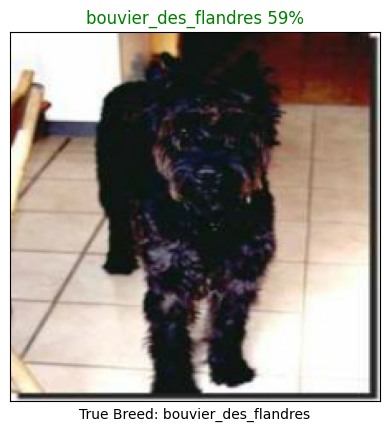

In [ ]:
visualizer(probabilities=predictions,
          labels=labels,
          images=images, n = 25)

In [ ]:
#Lets Create a Probability Distrbution Function Based off Breed

In [ ]:
import heapq

def pdf(probabilities, n=111, horizontal=10, vertical=6, ax=None, numeration = True):
    """
    Visualizes the Predicted Breed Output.
    """
    if ax is None:
        ax = plt.gca()

    quotient, remainder = divmod(n, 32)
    pred_prob = probabilities[n]
    top_10 = heapq.nlargest(10, pred_prob)
    indices = heapq.nlargest(10, range(len(pred_prob)), key=pred_prob.__getitem__)
    breeds_10 = [breeds[i] for i in indices]
    true_label = breeds[np.argmax(labels[quotient][remainder])]

    # Plot the bar chart on the provided axis
    bars = ax.bar(breeds_10, top_10, color="grey")
    ax.set_xlabel('Breed')
    ax.set_ylabel('Predicted Probability')
    ax.set_title('Top 10 Predicted Breed Probabilities')
    ax.tick_params(axis='x', rotation=90)

    # Change color for the true label if it is in the top 10
    if true_label in breeds_10:
        true_index = breeds_10.index(true_label)
        bars[true_index].set_color('green')


    if numeration is True:
      for bar, prob in zip(bars, top_10):
          ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height(),
                  f'{prob:.2f}', ha='center', va='bottom')




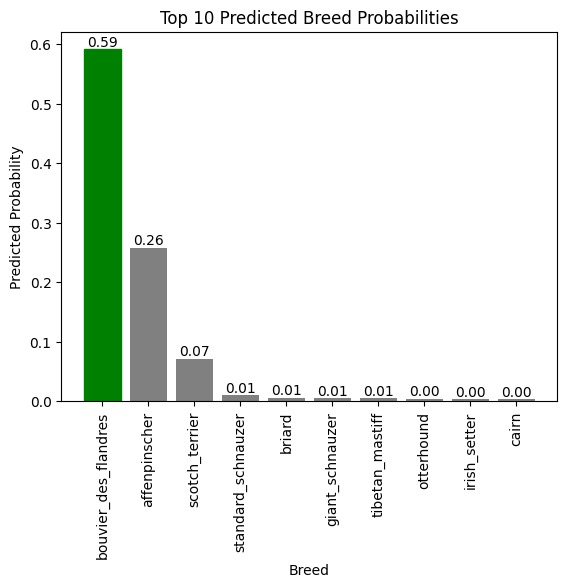

In [ ]:
pdf(predictions,25)

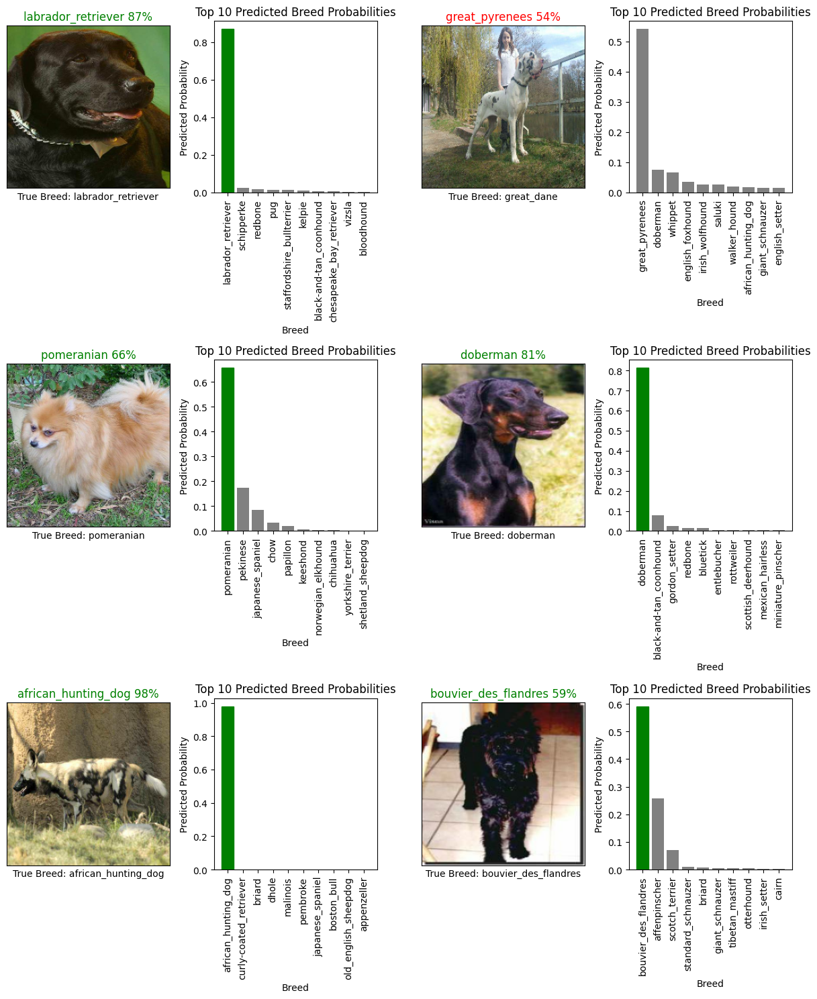

In [ ]:
import matplotlib.pyplot as plt

def combined_visualizer_grid(probabilities, images, labels, i_multiplier=0, num_rows=3, num_cols=2):
    # Number of images we want to display
    num_images = num_rows * num_cols

    # Increase figure size to give more space to each plot
    fig, axs = plt.subplots(num_rows, 2 * num_cols, figsize=(6 * num_cols, 5 * num_rows))

    # Iterate over the number of images we want to plot
    for i in range(num_images):
        # Calculate the index for the image and probability
        n = i + i_multiplier

        # Plot the image on the left (odd indexed axes)
        visualizer(probabilities, images, labels, n=n, ax=axs[i // num_cols, 2 * (i % num_cols)])

        # Plot the probability bar graph on the right (even indexed axes)
        pdf(probabilities, n=n, numeration = False,ax=axs[i // num_cols, 2 * (i % num_cols) + 1])

    # Adjust the space between plots to reduce crowding
    plt.subplots_adjust(wspace=1.2, hspace=1.5)  # Increase spacing between subplots

    # Adjust layout for better visual appearance
    plt.tight_layout()
    plt.show()

# Example call
combined_visualizer_grid(predictions, images, labels, i_multiplier=20, num_rows=3, num_cols=2)


In [ ]:
#Saving The Model To Not Ruin Our Hardwork

In [ ]:
def save_model(model, suffix=None, name = datetime.datetime.now().strftime("%Y%m%d-%H%M%s")):
  """
  Saves the model
  """
  modeldir = os.path.join("/content/drive/MyDrive/Dog-Breed-Selector/Models", name )
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
save_model(model, suffix="1000-Dogs-mobilenet_v2")

Saving model to: /content/drive/MyDrive/Dog-Breed-Selector/Models/20241125-01571732499868-1000-Dogs-mobilenet_v2.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/Dog-Breed-Selector/Models/20241125-01571732499868-1000-Dogs-mobilenet_v2.h5'

In [ ]:
# Load a trained model
loaded_model = load_model('/content/drive/MyDrive/Dog-Breed-Selector/Models/20241124-09461732441566-1000-Dogs-mobilenet_v2.h5')

Loading saved model from: /content/drive/MyDrive/Dog-Breed-Selector/Models/20241124-09461732441566-1000-Dogs-mobilenet_v2.h5


In [ ]:
model.evaluate(val_data)

7/7 [==============================] - 0s 46ms/step - loss: 1.3172 - accuracy: 0.6400


[1.3172303438186646, 0.6399999856948853]

In [ ]:
loaded_model.evaluate(val_data)

7/7 [==============================] - 1s 49ms/step - loss: 1.4079 - accuracy: 0.6450


[1.4079349040985107, 0.6449999809265137]

# Training The Model on The Full Data

In [ ]:
len(x), len(y)

(10222, 10222)

In [ ]:
full_set = create_batches(x, y)

Creating a Training Dataset


In [ ]:
full_set

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
full_model = create_model()

Building Model with the following parameters: 
Input Shape: [None, 224, 224, 3]
Output Shape: 120


In [ ]:
full_model_tensorboard = create_callback()
full_model_earlystop = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_set,
               epochs=num_of_epochs,
               callbacks=[full_model_tensorboard, full_model_earlystop])

Epoch 1/100
320/320 [==============================] - 839s 3s/step - loss: 1.2836 - accuracy: 0.6799
Epoch 2/100
320/320 [==============================] - 17s 53ms/step - loss: 0.3788 - accuracy: 0.8823
Epoch 3/100
320/320 [==============================] - 17s 53ms/step - loss: 0.2218 - accuracy: 0.9388
Epoch 4/100
320/320 [==============================] - 17s 53ms/step - loss: 0.1431 - accuracy: 0.9644
Epoch 5/100
320/320 [==============================] - 17s 53ms/step - loss: 0.0981 - accuracy: 0.9789
Epoch 6/100
320/320 [==============================] - 17s 53ms/step - loss: 0.0721 - accuracy: 0.9870
Epoch 7/100
320/320 [==============================] - 17s 53ms/step - loss: 0.0525 - accuracy: 0.9929
Epoch 8/100
320/320 [==============================] - 17s 53ms/step - loss: 0.0423 - accuracy: 0.9953
Epoch 9/100
320/320 [==============================] - 17s 53ms/step - loss: 0.0334 - accuracy: 0.9968
Epoch 10/100
320/320 [==============================] - 17s 53ms/step - lo

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2", name = "model_2")

Saving model to: /content/drive/MyDrive/Dog-Breed-Selector/Models/model_2-full-image-set-mobilenetv2.h5...


'/content/drive/MyDrive/Dog-Breed-Selector/Models/model_2-full-image-set-mobilenetv2.h5'

In [ ]:
loaded_full_model = load_model("/content/drive/MyDrive/Dog-Breed-Selector/Models/model_2-full-image-set-mobilenetv2.h5")

Loading saved model from: /content/drive/MyDrive/Dog-Breed-Selector/Models/model_2-full-image-set-mobilenetv2.h5


In [ ]:
# Load test image filenames
test_path = "/content/drive/MyDrive/Dog-Breed-Selector/test"
test_filenames = [os.path.join(test_path, fname) for fname in os.listdir(test_path)]


In [ ]:
test_data = create_batches(test_filenames, test_data=True)

Creating Test Data Batches


In [ ]:
missing_files = [fname for fname in test_filenames if not os.path.exists(fname)]
if missing_files:
    print(len(missing_files))
    print(f"Missing files: {missing_files}")

else:
    # Create test data batches
    test_data = create_batches(test_filenames, test_data=True)

    # Make predictions
    test_predictions = loaded_full_model.predict(test_data, verbose=1)

Creating Test Data Batches
324/324 [==============================] - 269s 820ms/step


In [ ]:
np.savetxt("/content/drive/MyDrive/Dog-Breed-Selector/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
test_predictions = np.loadtxt("/content/drive/MyDrive/Dog-Breed-Selector/preds_array.csv", delimiter=",")

# The Fun Part: Trying Out Our Own Personal Dog Images

In [364]:
import os
custom_path = "/content/drive/MyDrive/Dog-Breed-Selector/My Pics"
custom_image_paths = [os.path.join(custom_path, fname) for fname in os.listdir(custom_path)]


In [365]:
custom_image_paths

['/content/drive/MyDrive/Dog-Breed-Selector/My Pics/download.jpg',
 '/content/drive/MyDrive/Dog-Breed-Selector/My Pics/dog_2.jpg']

In [366]:
my_data = create_batches(custom_image_paths, test_data=True)
my_data

Creating Test Data Batches


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [367]:
custom_preds = loaded_full_model.predict(my_data)

1/1 [==============================] - 1s 718ms/step


In [368]:
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['german_shepherd', 'staffordshire_bullterrier']

In [369]:
custom_images = []
# Loop through unbatched data
for image in my_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

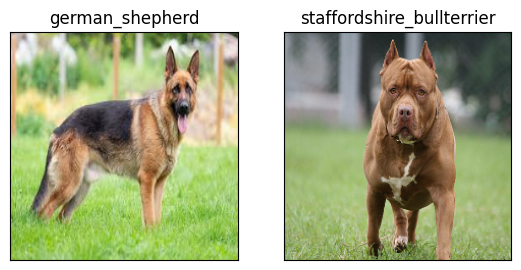

In [370]:
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)

In [ ]:
#Nailed It